<a href="https://colab.research.google.com/github/HoFangHuy/AI/blob/main/Tri_tue_may_tao.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Thông số
img_size = (128, 128)
batch_size = 32
data_path = '/content/drive/MyDrive/Data AI'

# Tiền xử lý dữ liệu
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_gen = datagen.flow_from_directory(
    data_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_gen = datagen.flow_from_directory(
    data_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Mô hình CNN
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=img_size + (3,)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_gen.num_classes, activation='softmax')
])

model.compile(optimizer=Adam(0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_gen, validation_data=val_gen, epochs=10)

Found 1926 images belonging to 4 classes.
Found 480 images belonging to 4 classes.
Epoch 1/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1035s 17s/step - accuracy: 0.7087 - loss: 2.0304 - val_accuracy: 0.0750 - val_loss: 14.4424
Epoch 2/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - accuracy: 0.7884 - loss: 0.6545 - val_accuracy: 0.0688 - val_loss: 11.3922
Epoch 3/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - accuracy: 0.8075 - loss: 0.5037 - val_accuracy: 0.1729 - val_loss: 6.7704
Epoch 4/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 11s 173ms/step - accuracy: 0.8293 - loss: 0.4337 - val_accuracy: 0.7688 - val_loss: 3.9848
Epoch 5/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - accuracy: 0.8476 - loss: 0.3746 - val_accuracy: 0.7479 - val_loss: 2.9855
Epoch 6/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - accuracy: 0.8523 - loss: 0.3900 - val_accuracy: 0.7937 - val_loss: 5.3765
Epoch 7/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - accuracy: 0.8693 - loss: 0.3406 - val_accuracy: 0.8125 - val_loss: 2.3158
Epoch 8/10
6

In [7]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17485, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 17485 (delta 80), reused 31 (delta 31), pack-reused 17376 (from 3)
Receiving objects: 100% (17485/17485), 16.33 MiB | 17.17 MiB/s, done.
Resolving deltas: 100% (11984/11984), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s

In [9]:
import torch
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt

# Load model YOLO
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Load ảnh khay thức ăn
img_path = '/content/z6582833044510_7474a1a2b289d32c1ae3075e496449cb.jpg'
results = model_yolo(img_path)

# Hiển thị bounding boxes
results.render()
plt.imshow(results.ims[0])
plt.axis('off')
plt.title("YOLO phát hiện")
plt.show()

# Tạo thư mục lưu ảnh cắt
os.makedirs("/content/crops", exist_ok=True)
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
boxes = results.xyxy[0].cpu().numpy()

cropped_paths = []
for i, box in enumerate(boxes):
    x1, y1, x2, y2 = map(int, box[:4])
    crop = img_rgb[y1:y2, x1:x2]
    crop_path = f"/content/crops/monan_{i}.jpg"
    cv2.imwrite(crop_path, cv2.cvtColor(crop, cv2.COLOR_RGB2BGR))
    cropped_paths.append((crop_path, (x1, y1, x2, y2)))


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-13 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


In [11]:
label_map = {
    "0": "ga_chien",
    "1": "thit_kho",
    "2": "thit_kho_trung",
    "3": "trung_chien"
}

import json
with open("label_map.json", "w") as f:
    json.dump(label_map, f)
print("Đã tạo file label_map.json thành công!")


Đã tạo file label_map.json thành công!


In [16]:
model.save("/content/cnn_monan_model.h5")


In [17]:
import tensorflow as tf
import json

# Load model CNN và label map
cnn_model = tf.keras.models.load_model("/content/cnn_monan_model.h5")
with open("label_map.json") as f:
    label_map = json.load(f)

# Giá món ăn
gia_monan = {
    "thit_kho": "10.000đ",
    "thit_kho_trung": "10.000đ",
    "trung_chien": "5.000đ",
    "ga_chien": "15.000đ"
}

def predict_image(image_path):
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, (128, 128))
    input_img = np.expand_dims(img_resized / 255.0, axis=0)
    pred = cnn_model.predict(input_img)
    class_id = np.argmax(pred)
    label = label_map[str(class_id)]
    price = gia_monan.get(label, "Không rõ")
    return label, price


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


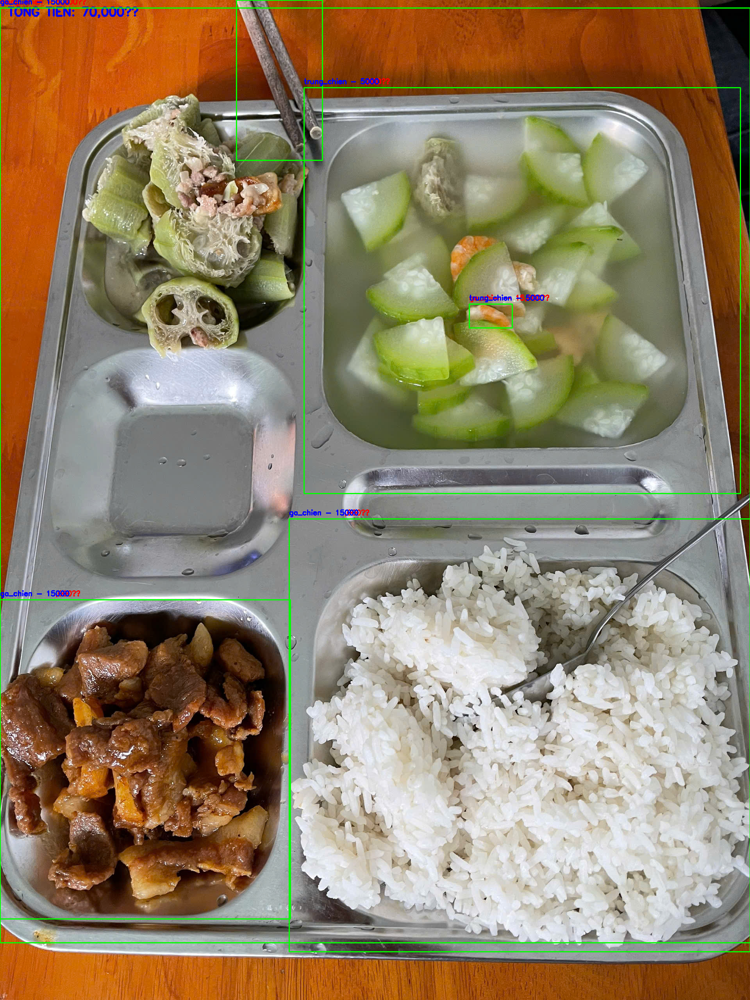

In [21]:
# Hiển thị kết quả cuối cùng
img_display = img_rgb.copy()

for crop_path, (x1, y1, x2, y2) in cropped_paths:
    label, price = predict_image(crop_path)
    text = f"{label} - {price}"
    cv2.rectangle(img_display, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_display, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

# Nếu hiển thị không ra ảnh bằng matplotlib
from google.colab.patches import cv2_imshow
cv2_imshow(cv2.cvtColor(img_display, cv2.COLOR_RGB2BGR))  # RGB → BGR để hiển thị đúng màu


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-13 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


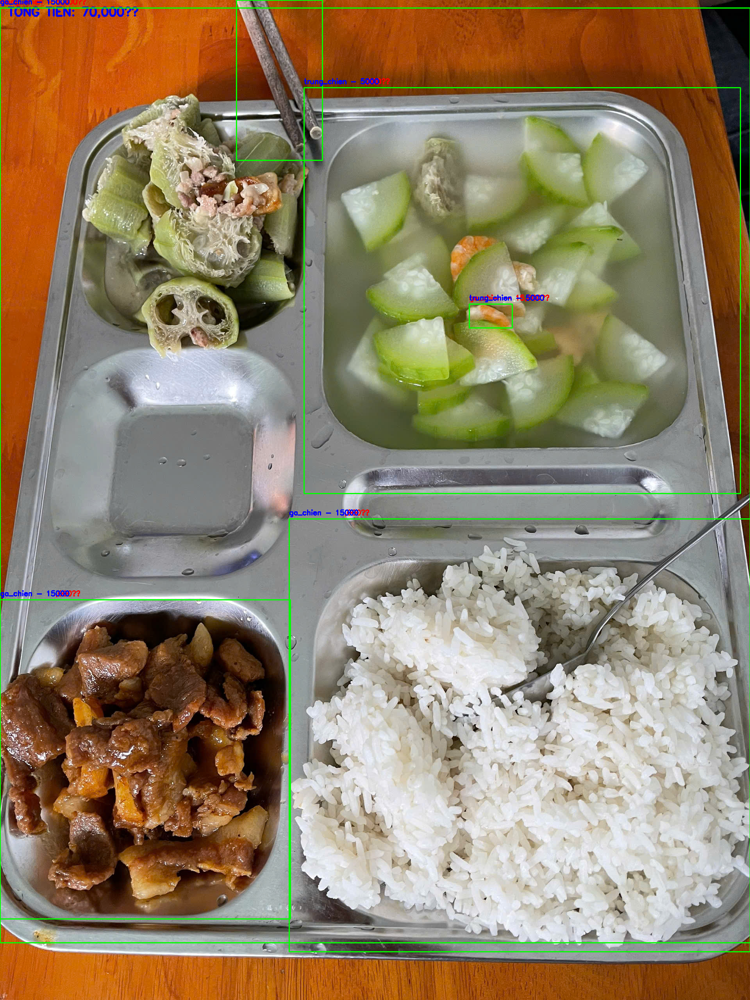

In [22]:
import torch
import cv2
import numpy as np
import tensorflow as tf
import json
import os
from matplotlib import pyplot as plt

# Load YOLOv5
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Load CNN model
cnn_model = tf.keras.models.load_model("/content/cnn_monan_model.h5")
with open("label_map.json") as f:
    label_map = json.load(f)  # e.g. {"0": "ga_chien", "1": "thit_kho", ...}

# Bảng giá món ăn
gia_monan = {
    "thit_kho": 10000,
    "thit_kho_trung": 10000,
    "trung_chien": 5000,
    "ga_chien": 15000
}

# Hàm dự đoán món ăn từ ảnh
def predict_monan(image):
    img_resized = cv2.resize(image, (128, 128))
    input_img = np.expand_dims(img_resized / 255.0, axis=0)
    pred = cnn_model.predict(input_img)
    class_id = np.argmax(pred)
    label = label_map[str(class_id)]
    price = gia_monan.get(label, 0)
    return label, price

# Load ảnh đầu vào
img_path = '/content/z6582833044510_7474a1a2b289d32c1ae3075e496449cb.jpg'
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Detect bằng YOLO
results = model_yolo(img_rgb)
boxes = results.xyxy[0].cpu().numpy()

# Duyệt qua từng box, crop và nhận diện bằng CNN
tong_tien = 0
for i, box in enumerate(boxes):
    x1, y1, x2, y2, conf, cls = map(int, box[:6])
    crop = img_rgb[y1:y2, x1:x2]

    # Nếu crop hợp lệ
    if crop.shape[0] > 0 and crop.shape[1] > 0:
        label, price = predict_monan(crop)
        tong_tien += price
        # Ghi khung và nhãn
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_rgb, f"{label} - {price:,}đ", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

# Ghi tổng tiền
cv2.putText(img_rgb, f"TONG TIEN: {tong_tien:,}đ", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 3)

# Hiển thị ảnh kết quả
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("Kết quả nhận diện món ăn & tính tổng tiền")
plt.show()
from google.colab.patches import cv2_imshow
cv2_imshow(cv2.cvtColor(img_display, cv2.COLOR_RGB2BGR))  # RGB → BGR để hiển thị đúng màu